In [297]:
import torch
from tqdm import tqdm
import pdbtools
import potential
import matplotlib.pyplot as plt
import torch.nn as nn
import numpy as np
from skimage.feature import peak_local_max
from scipy.interpolate import CubicSpline

%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [2]:
def plot3d(vol):
    fig, axes = plt.subplots(1, 3, dpi=200, constrained_layout=True)
    for i, ax in enumerate(axes.ravel()):
        im = ax.imshow(vol.sum(i))
        ax.set(xticks=[], yticks=[], title=f"projection along axis {i}")
        fig.colorbar(im, ax=ax, location="bottom")
    plt.show()


def plot_slices(
    vol, start_idx=0, end_idx=None, axis=0, ylabel=None, vmin=None, vmax=None
):
    nslices = 5
    sh = vol.shape
    if end_idx is None:
        idx_length = sh[axis] - start_idx - 1
        end_idx = start_idx + idx_length
    else:
        idx_length = end_idx - start_idx
    idx_interval = idx_length // nslices
    indices = torch.linspace(start_idx, end_idx, nslices).type(torch.int)

    fig, axes = plt.subplots(1, 5, dpi=200, figsize=(8, 2.5), constrained_layout=True)
    for ax, i in zip(axes.ravel(), indices):
        ax.set(xticks=[], yticks=[])
        if axis == 0:
            im = ax.imshow(vol[i, :, :], vmin=vmin, vmax=vmax)
        elif axis == 1:
            im = ax.imshow(vol[:, i, :], vmin=vmin, vmax=vmax)
        elif axis == 2:
            im = ax.imshow(vol[:, :, i], vmin=vmin, vmax=vmax)
        ax.set_title(f"Slice {i}")
        fig.colorbar(im, ax=ax, location="bottom")

    if ylabel is not None:
        axes[0].set_ylabel(ylabel)
    plt.suptitle(f"Slices along axis {axis}")
    plt.show()

In [3]:
fftn = lambda array: torch.fft.fftshift(torch.fft.fftn(torch.fft.ifftshift(array)))
ifftn = lambda array: torch.fft.fftshift(torch.fft.ifftn(torch.fft.ifftshift(array)))

In [67]:
def get_coordinates_from_frame(line_number, no_atoms=128000):
    coords = torch.zeros(no_atoms, 3)
    for i, s in enumerate(lines[line_number : line_number + no_atoms]):
        id, typ, x, y, z = s.split()
        coords[i, 0] = float(x)
        coords[i, 1] = float(y)
        coords[i, 2] = float(z)
    return coords

In [68]:
def trim_coordinates(coords, trim_size=100):
    trimmed_coords = []
    for co in coords:
        if not (
            torch.abs(co[0]) > trim_size // 2
            or torch.abs(co[1]) > trim_size // 2
            or torch.abs(co[2]) > trim_size // 2
        ):
            trimmed_coords.append(co)
    trimmed_coords = torch.stack(trimmed_coords)
    return trimmed_coords

In [19]:
def radial_profile_3d(data, center=None, return_r=False):
    m,n,o = np.shape(data)
    if center is None:
        center = 0,0,0
    x = np.arange(n) - (n)//2 + center[0]
    y = np.arange(m) - (m)//2 + center[1]
    z = np.arange(o) - (m)//2 + center[2]
    xx,yy,zz = np.meshgrid(x,y,z,indexing='ij')
    r = np.sqrt(xx**2 + yy**2 + zz**2)
    r = r.round().astype(int)
    tbin = np.bincount(r.ravel(), data.ravel())
    nr = np.bincount(r.ravel())
    radialprofile = tbin / nr
    if return_r:
        return r, radialprofile
    else:
        return radialprofile

## Open dump file
For stackingDisordered_20x20x20.MW_temp400.dump, the ice are melted at 400K under simulations at constant volume (so to keep density at 0.9400 cm^3/g). There is 128,000 mono-atomic water (they refer to this water model as they are modelling water molecule as one particle).
The simutlation time steps are 10 fs, ran for a total of 100,000 steps (so a total of 1,000,000 fs or 1 ns in simulation time). So the output frames are saved every 10,000 steps, leading to a total of 100 frames.

In [4]:
with open("ice-data/stackingDisordered_20x20x20.MW_temp400.dump") as f:
    lines = f.readlines()

## Search for each frame.

In [5]:
indexes = [i for i, x in tqdm(enumerate(lines)) if x == 'ITEM: TIMESTEP\n']

12928909it [00:01, 8763294.52it/s]


## Get 90 frames of ice volume

In [348]:
dx = 0.5
n = 200
super_sampling_factor = 4

ices = []

for frame in tqdm(indexes[10:]):
    coordstart = frame + 9
    coords = get_coordinates_from_frame(coordstart)

    # recenters coordinates onto origin (0,0,0)
    center = pdbtools.center_of_particle(coords)
    centered_coords = coords - center.reshape(1, -1)
    centered_coords = trim_coordinates(centered_coords, trim_size=100)

    atomic_numbers = torch.ones(len(centered_coords), dtype=torch.int) * 8


    ice_vol_3d = potential.build_potential_volume_fftconvolve(
        atomic_numbers,
        centered_coords,
        (n, n, n),
        (dx, dx, dx),
        # atom_size_px=11,
        super_sampling_factor=super_sampling_factor,
        convention="relion",
        method="snapped-3d",
        compute_high_res=True,
        disable_tqdm=True
    )

    ices.append(ice_vol_3d)

ices = torch.stack(ices)

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 91/91 [13:07<00:00,  8.66s/it]


In [113]:
ices.shape, centered_coords.shape

(torch.Size([40, 200, 200, 200]), torch.Size([31466, 3]))

In [260]:
mdsim_ice_deltas = torch.zeros(n,n,n)
x, y, z, X, Y, Z = potential.coordinate_grid_3d(
            (n, n, n), (dx, dx, dx))
for cc in centered_coords:
    xi, yi, zi = potential.nearest_index(x, y, z, cc[0], cc[1], cc[2])
    mdsim_ice_deltas[zi, yi, xi] = 1

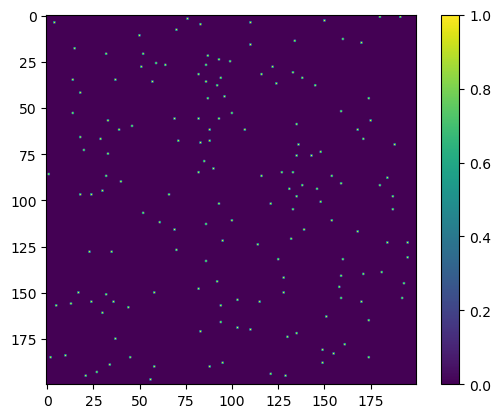

In [268]:
plt.imshow(mdsim_ice_deltas[50])
plt.colorbar()

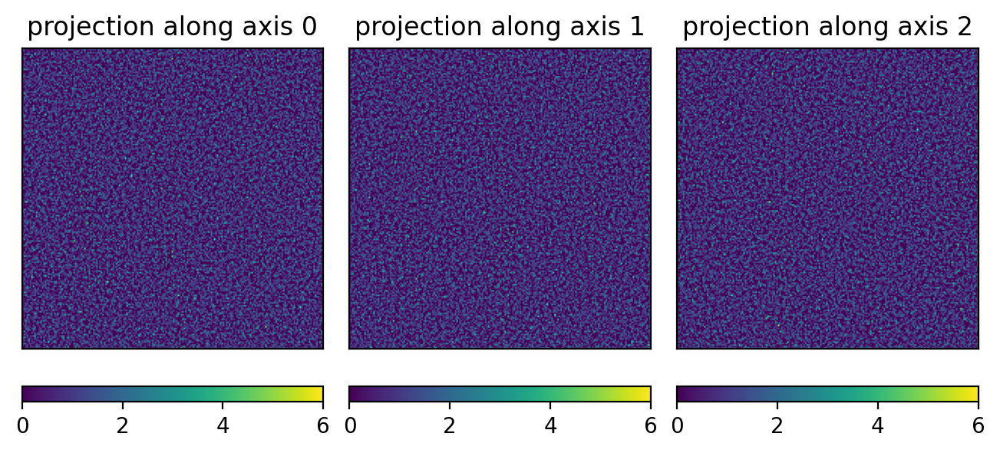

In [261]:
plot3d(mdsim_ice_deltas)

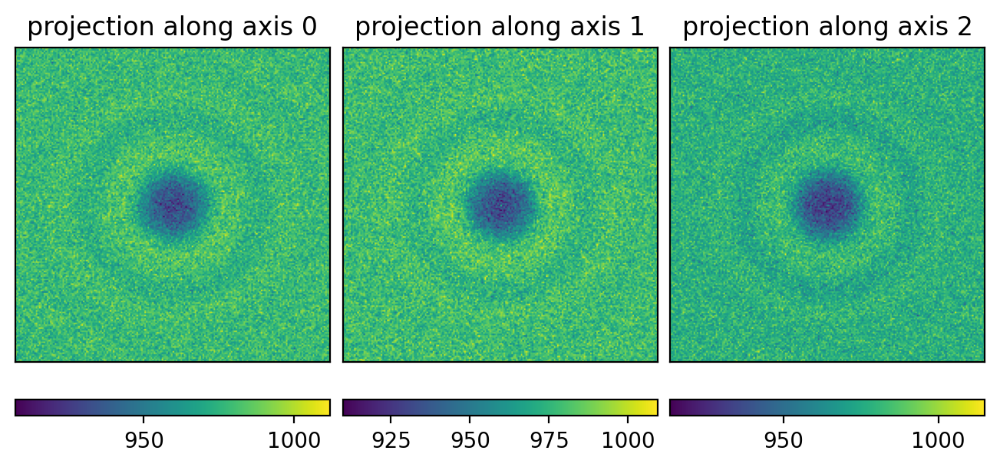

In [263]:
plot3d(torch.log(torch.abs(fftn(mdsim_ice_deltas))))

## Get Fourier kernel

In [349]:
ices_f = []
for ice in tqdm(ices):
    ices_f.append(fftn(ice))
ices_f = torch.stack(ices_f)

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 91/91 [00:02<00:00, 41.21it/s]


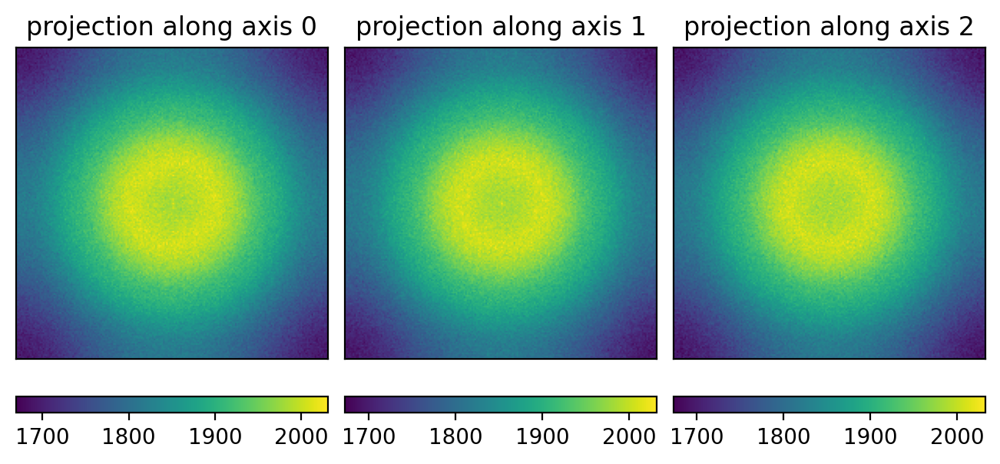

In [276]:
plot3d(torch.log(torch.abs(ices_f[0])))

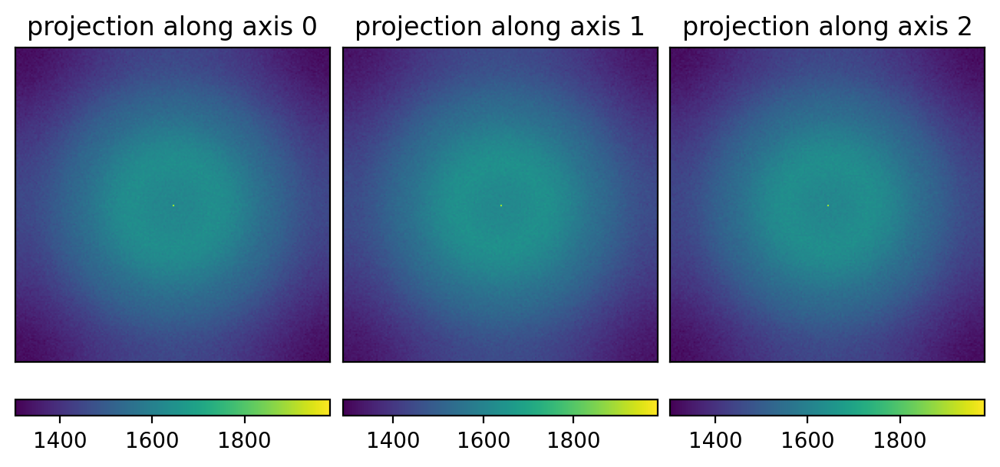

In [280]:
plot3d(torch.log(torch.abs(ices_f.mean(dim=0))))

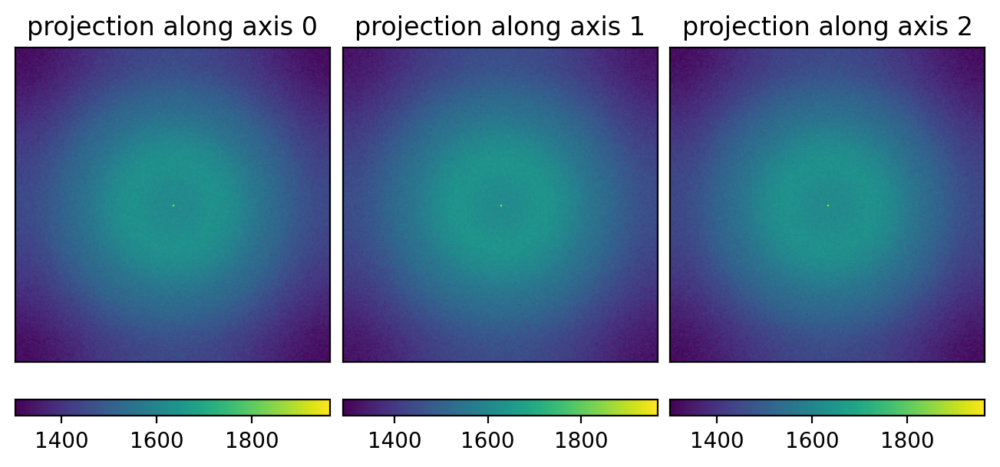

In [277]:
plot3d(torch.log(torch.abs(ices_f.mean(dim=0))))

## 3D radial average

In [281]:
kx = torch.fft.fftfreq(n, dx)
dk = kx[1] - kx[0]

In [282]:
radial_profile_real = radial_profile_3d(ices_f[0].real)
radial_profile_imag = radial_profile_3d(ices_f[0].imag)

In [283]:
avg_radial_profile_real = radial_profile_3d(ices_f.mean(dim=0).real)
avg_radial_profile_imag = radial_profile_3d(ices_f.mean(dim=0).imag)

In [284]:
k = torch.arange(len(radial_profile_real)) * dk

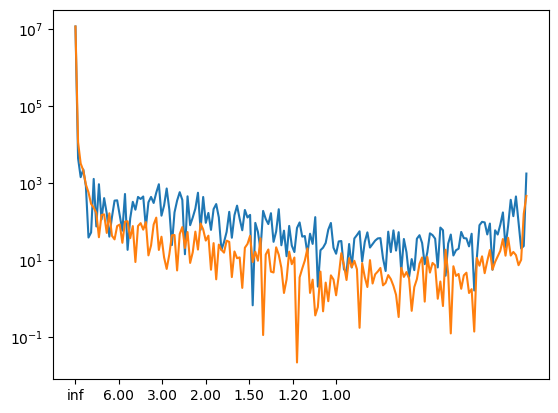

In [285]:
nticks = 7
plt.semilogy(k, np.abs(radial_profile_real + 1j*radial_profile_imag))
plt.semilogy(k, np.abs(avg_radial_profile_real + 1j*avg_radial_profile_imag))
plt.xticks(torch.linspace(0,1,nticks), labels=[f'{1/k:.2f}' for k in torch.linspace(0,1,nticks)])
plt.show()

In [290]:
kx = torch.fft.fftshift(torch.fft.fftfreq(n, dx))
ky = kx.clone()
kz = kx.clone()
KZ, KY, KX = torch.meshgrid(kz, ky, kx, indexing="ij")

In [291]:
K = torch.sqrt(KX**2 + KY**2 + KZ**2)

In [299]:
spl_imag = CubicSpline(k, radial_profile_imag)
spl_real = CubicSpline(k, radial_profile_real)

In [308]:
interp_imag = spl_imag(K.ravel())
interp_real = spl_real(K.ravel())

In [309]:
interp = interp_real + 1j * interp_imag

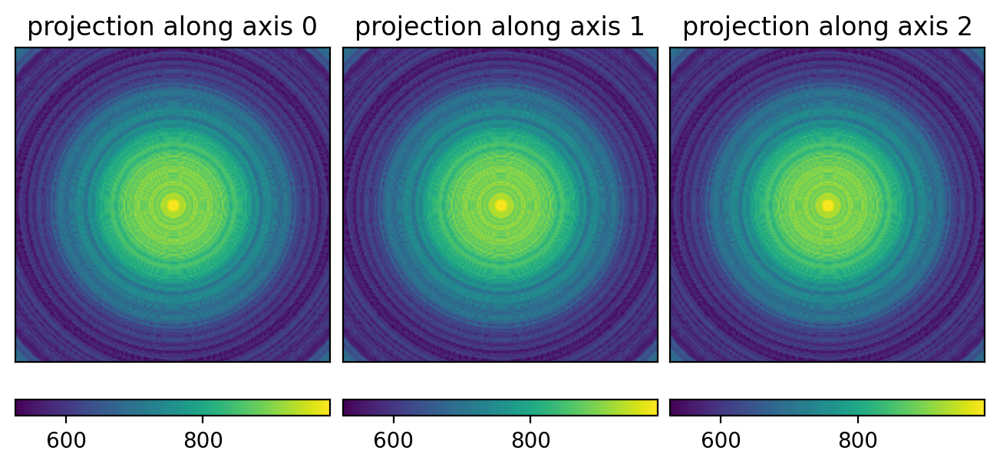

In [311]:
plot3d(np.log(np.abs(interp.reshape(n,n,n))))

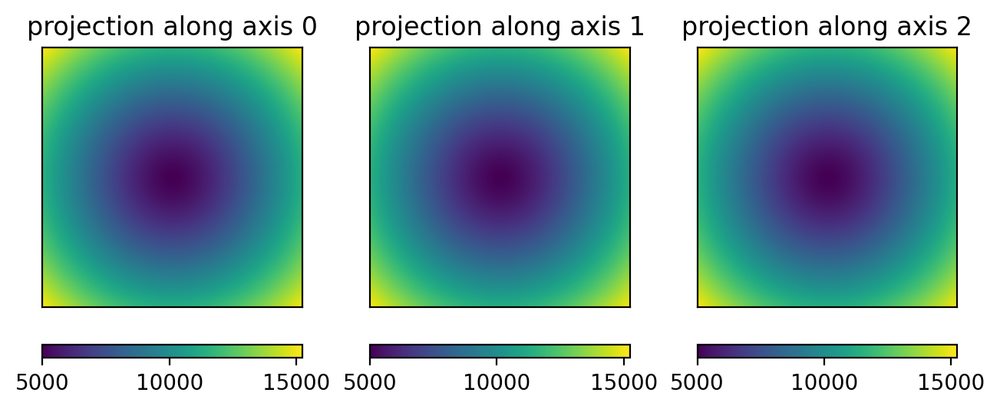

In [305]:
plot3d(np.abs(R.ravel().reshape(n,n,n)))

## Ice iteration

In [350]:
avogadro = 6.02214076e23
density_of_amorphous_ice = 0.94  # [g/cm3]
molar_mass_of_water = 18.01528  # [g/mol]
ndensity_of_amorphous_ice = (
    density_of_amorphous_ice * avogadro / molar_mass_of_water * 1e-24
)  # [particles / A3]

dv = dx**3
nv = n**3
total_vol = nv * dv #A^3
n_ice_molecules = int(ndensity_of_amorphous_ice * total_vol)
print(n_ice_molecules)

# sample ice positions
# this may cause overlapping ice molecules.
ice_idx = np.random.choice(n**3, n_ice_molecules, replace=False)
ice_vol_init = torch.zeros(n**3)
ice_vol_init[ice_idx] = 1
ice_vol_init = ice_vol_init.reshape(n,n,n)

# x_ice = (torch.rand(n_ice_molecules) - 0.5) * dx * n
# y_ice = (torch.rand(n_ice_molecules) - 0.5) * dx * n
# z_ice = (torch.rand(n_ice_molecules) - 0.5) * dx * n
# ice_centers = torch.stack((x_ice, y_ice, z_ice), dim=1)
# ice_centers.shape

31422


In [357]:
np.mod(90, 90)

0

In [364]:
niter = 800
# ice_vol = ice_vol_init.clone()
for i in tqdm(range(niter)):
    ice_vol_f = fftn(ice_vol)
    j = np.mod(i, 90)
    ice_vol_f *= ices_f[j]
    # ice_vol_f *= ices_f.mean(dim=0)
    new_ice = torch.abs(ifftn(ice_vol_f))
    peaks = peak_local_max(new_ice.numpy(), num_peaks=n_ice_molecules, min_distance=1)

    ice_vol = torch.zeros(n,n,n)
    for peak in peaks:
        ice_vol[*peak] = 1

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 800/800 [55:21<00:00,  4.15s/it]


IndexError: index 200 is out of bounds for dimension 0 with size 200

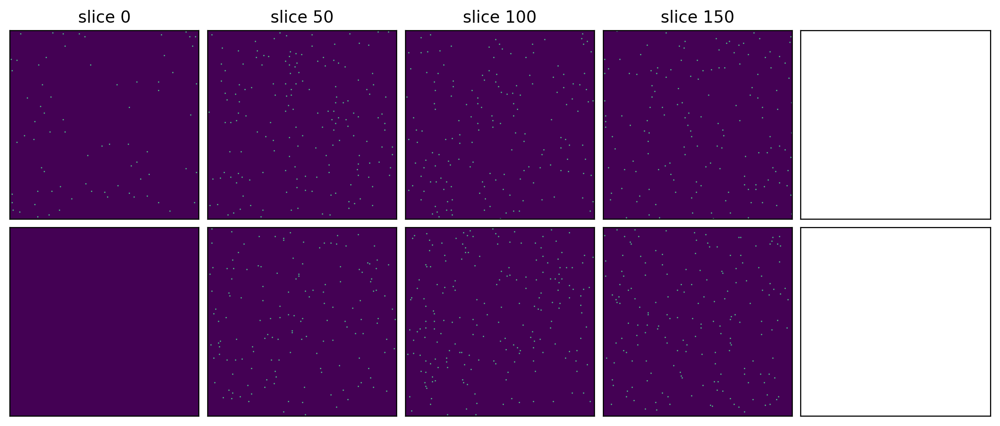

In [376]:
fig, axes = plt.subplots(2,5,constrained_layout=True, figsize=(10,4.2), dpi=200)
[ax.set(xticks=[], yticks=[]) for ax in axes.ravel()]
for i in range(5):
    idx = i * 50
    ax = axes[0,i]
    ax.imshow(mdsim_ice_deltas[idx])
    ax.set_title(f'slice {idx}')
    
    ax = axes[1,i]
    ax.imshow(ice_vol[idx])
axes[0,0].set_ylabel('MD sim')
axes[1,0].set_ylabel('Generated')
plt.show()

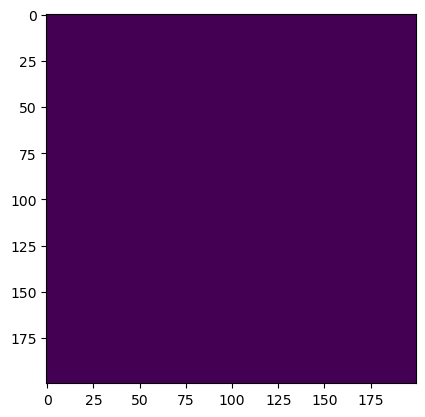

In [367]:
plt.imshow(ice_vol[0])

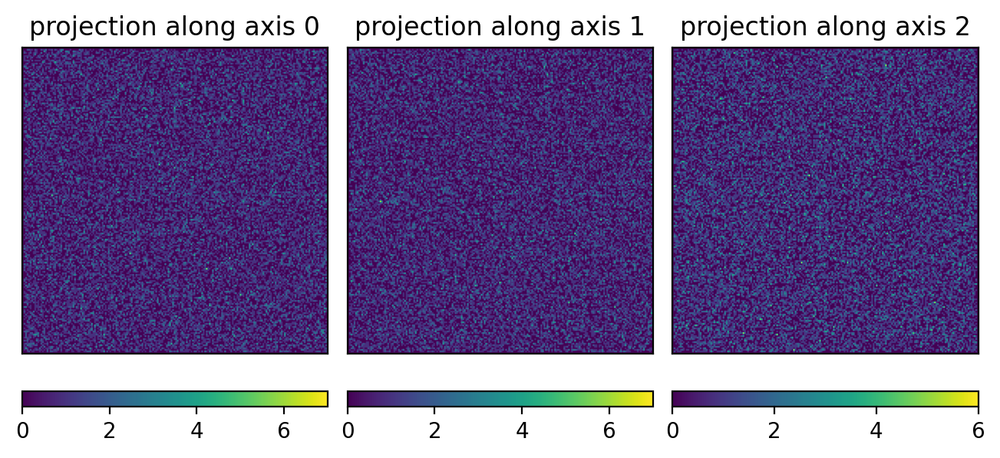

In [365]:
plot3d(ice_vol)

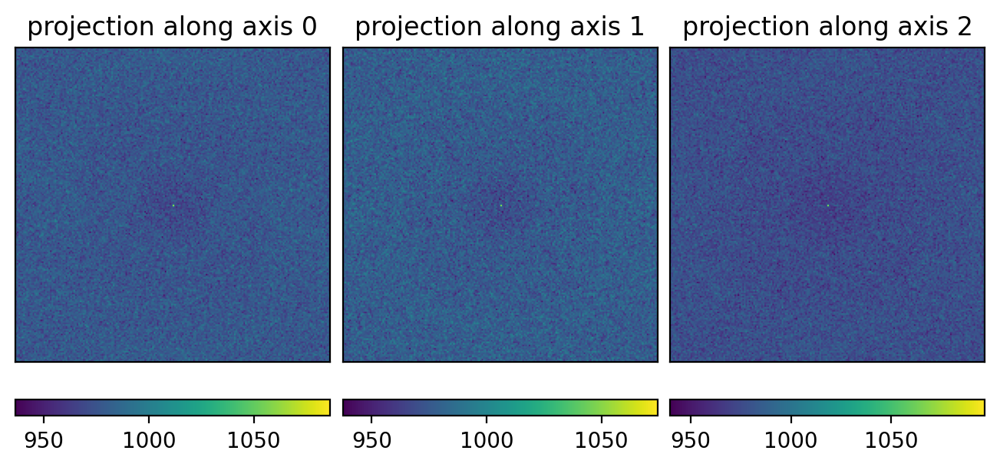

In [366]:
plot3d(torch.log(torch.abs(fftn(ice_vol))))

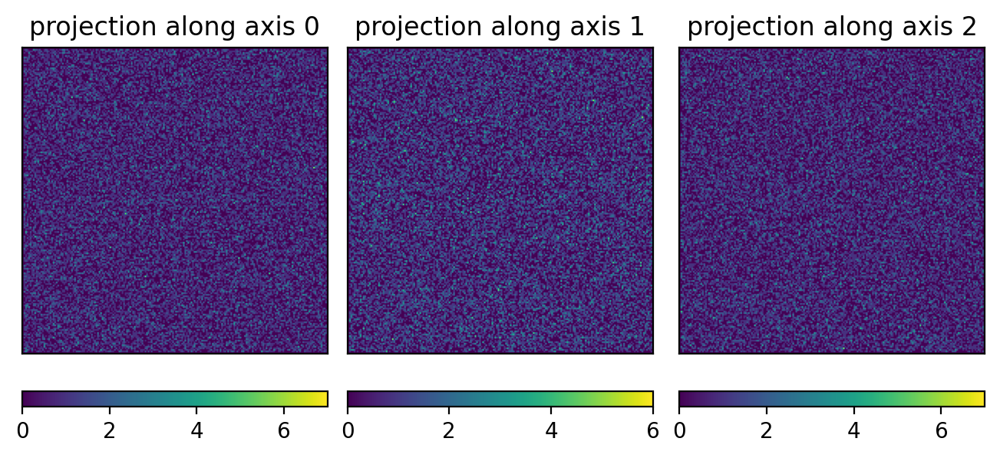

In [360]:
plot3d(ice_vol)

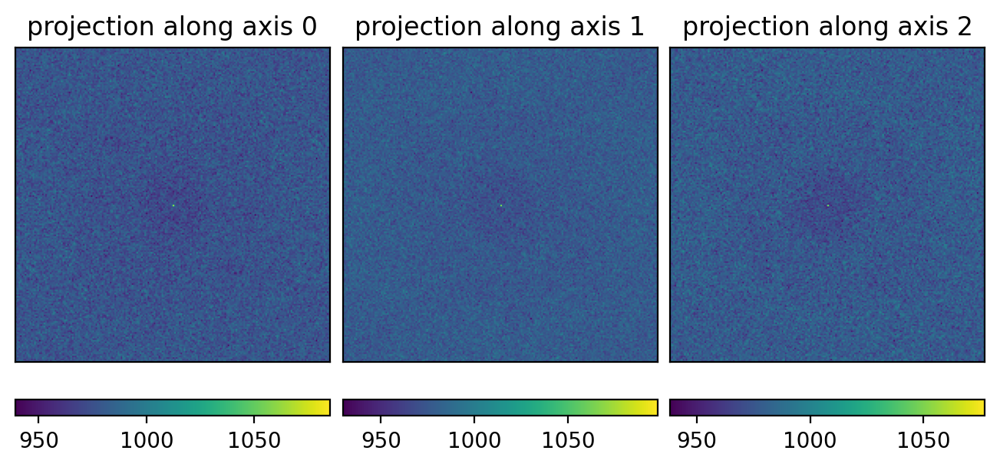

In [361]:
plot3d(torch.log(torch.abs(fftn(ice_vol))))

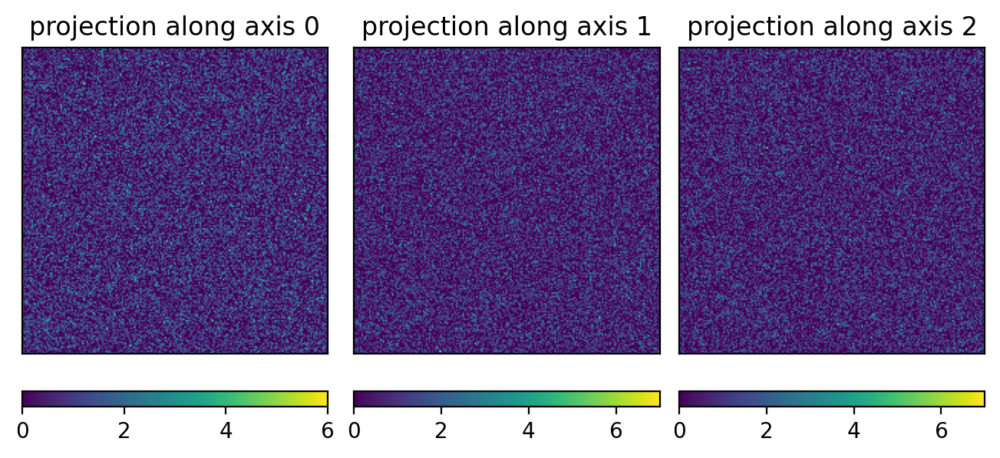

In [362]:
plot3d(ice_vol_init)

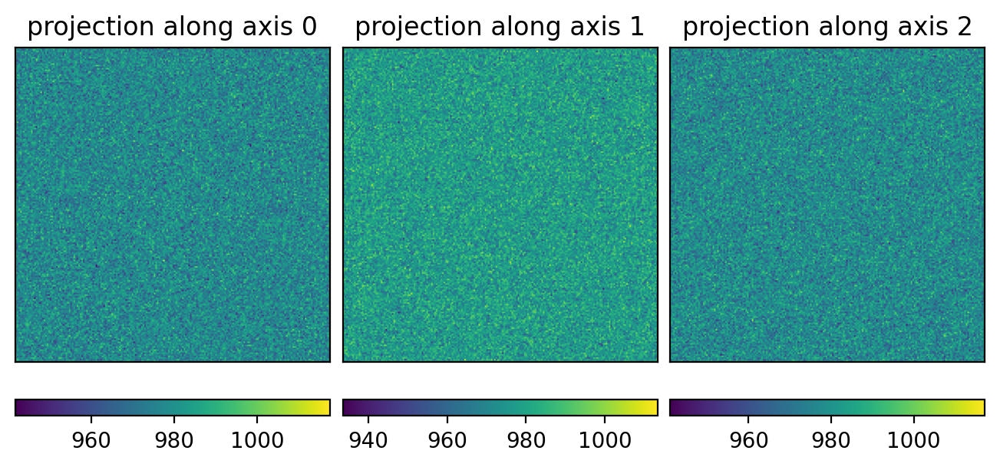

In [363]:
plot3d(torch.log(torch.abs(fftn(ice_vol_init))))

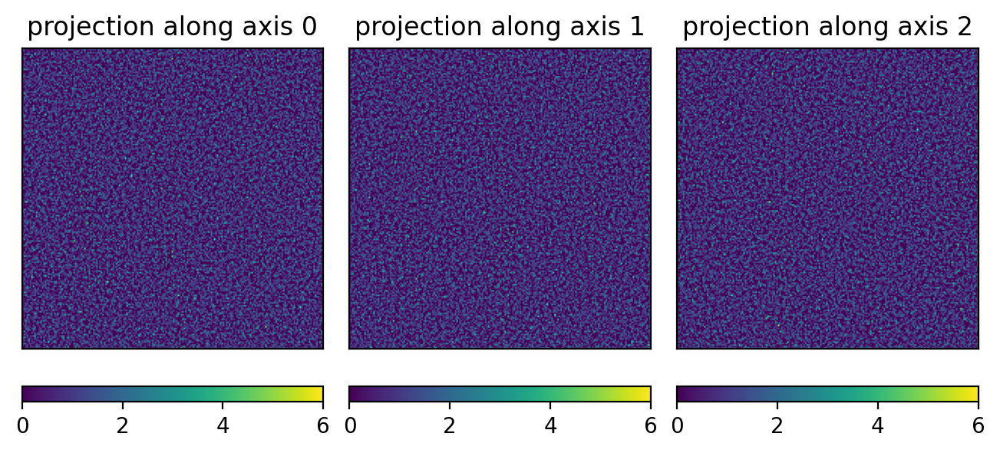

In [336]:
plot3d(mdsim_ice_deltas)